In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import numpy.random as npr
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec  # Import for custom grid layout
import ssm
from sklearn import preprocessing
from sklearn.model_selection import KFold
from scipy import stats

from notebooks.imports import *
from config import dir_config, main_config
from src.utils.glm_hmm_utils import *
from src.utils import pmf_utils
import pickle
import copy

### Configuration

In [3]:
from config import dir_config, main_config

raw_dir = Path(dir_config.data.raw)
processed_dir = Path(dir_config.data.processed)

metadata = pd.read_csv(Path(processed_dir, "processed_metadata_accu_60.csv"))
data = pd.read_csv(Path(processed_dir, "processed_data_accu_60_all.csv"))

metadata['session_id'] = metadata[['subject_id', 'treatment']].apply(lambda x: '_'.join(x.astype(str).str.upper()), axis=1)
data['session_id'] = data[['subject_id', 'medication']].apply(lambda x: '_'.join(x.astype(str).str.upper()), axis=1)

experiment_sites = ["Stanford"]
metadata = metadata[metadata['experiment_site'].isin(experiment_sites)].reset_index(drop=True)
data = data[data['subject_id'].isin(metadata['subject_id'])].reset_index(drop=True)

### Helper Functions

In [4]:
def get_train_test_split(n_trials, target_fold, k_folds):
    kf = KFold(n_splits=k_folds, shuffle=True, random_state=1)
    splits = [(train_idx, test_idx) for train_idx, test_idx in kf.split(np.arange(n_trials))]
    return splits[target_fold]

In [5]:
def psychometric_fit(stimulus, choices, expected_choice_prob, ax, color, label, n_sample = 10):
    data = {
        "signed_coherence": np.array(stimulus)*100,
        "choice": choices
    }
    x_data, y_data, _, x_model, y_model = pmf_utils.get_psychometric_data(data)

    x_model_hat, y_model_hat = np.full((n_sample,len(x_model)),np.nan), np.full((n_sample,len(y_model)),np.nan)

    x_model_hat, y_model_hat = np.full((n_sample,len(x_model)),np.nan), np.full((n_sample,len(y_model)),np.nan)
    for idx_sample in range(n_sample):
        data_fitted = {
            "signed_coherence": np.array(stimulus)*100,
            "choice": npr.binomial(1, expected_choice_prob)
        }
        x_data, y_data_hat, _, x_model_hat[idx_sample,:], y_model_hat[idx_sample,:] = pmf_utils.get_psychometric_data(data_fitted)

    ax.plot(x_data, y_data,'o', color=color)
    ax.plot(x_model, y_model, color=color, label=label)
    ax.plot(np.mean(x_model_hat, axis=0), np.mean(y_model_hat, axis=0), color = color, linestyle='--')
    ax.fill_between(np.mean(x_model_hat, axis=0),
                    np.mean(y_model_hat, axis=0) - np.std(y_model_hat, axis=0),
                    np.mean(y_model_hat, axis=0) + np.std(y_model_hat, axis=0),
                    color=color, alpha=0.3)

    ax.set_xlim(min(x_data),max(x_data))
    ax.set_xlabel('Coherence')
    ax.set_ylabel('choices toRF')
    ax.set_title('Psychometric fits',fontsize=15)
    ax.legend()

In [6]:
def plot_model_fits(model, choices, input, stimulus, mask, n_states, session_name, trial_indices=None):
    transition_matrix = model.transitions.params
    transition_matrix = np.exp(transition_matrix)[0]
    weights = -model.observations.params
    posterior_probs = model.expected_states(data=choices, input=input, mask=np.array(mask).reshape(-1,1))[0]

    fig = plt.figure(figsize=(14, 4))  # Wider figure for better spacing
    gs = gridspec.GridSpec(1, 4, width_ratios=[1, 1, 1, 2])  # Merge last two subplots

    cols = ['#ff7f00', '#4daf4a', '#377eb8']  # Add more colors if needed for higher n_states
    plt.suptitle(session_name)
    # ----  First Subplot: Psychometric Curves ----
    ax1 = plt.subplot(gs[0])

    weighted_sum = np.sum(weights * input[None, :, :], axis=-1).T
    sigmoid_output = 1 / (1 + np.exp(-weighted_sum))
    glm_hmm_expected_choice_prob = np.sum(sigmoid_output * posterior_probs, axis=1, keepdims=True)

    mask = np.where(mask)[0]
    if trial_indices is not None:
        mask = np.intersect1d(mask, trial_indices)

    equal_indices = np.intersect1d(mask, np.where(input[:,1]==0)[0])
    unequal_indices = np.intersect1d(mask, np.where(input[:,1]==1)[0])


    psychometric_fit(stimulus[equal_indices], choices[equal_indices], glm_hmm_expected_choice_prob[equal_indices], ax1, '#377eb8', label="Equal")
    psychometric_fit(stimulus[unequal_indices], choices[unequal_indices], glm_hmm_expected_choice_prob[unequal_indices], ax1, '#974810', label="Unequal")

    # ---- Second Subplot: GLM Weights ----
    ax2 = plt.subplot(gs[1])
    for k in range(n_states):
        ax2.plot(np.arange(input.shape[1]), weights[k][0], marker='o',
                color=cols[k], linestyle='-', lw=1.5, label=f"State {k+1}")

    ax2.tick_params(axis='y', labelsize=10)
    ax2.set_ylabel("GLM weight", fontsize=15)
    ax2.set_xlabel("covariate", fontsize=15)
    ax2.set_xticks(range(input.shape[1]))
    ax2.set_xticklabels(['stimulus', 'color', 'bias', 'previous choice', 'previous target', 'previous color'], fontsize=12, rotation=30)
    ax2.axhline(y=0, color="k", alpha=0.5, ls="--")
    ax2.legend()
    ax2.set_title("GLM weights", fontsize=15)

    # ---- Third Subplot: Transition Matrix ----
    ax3 = plt.subplot(gs[2])
    im = ax3.imshow(transition_matrix, vmin=-0.8, vmax=1, cmap='bone')
    for i in range(transition_matrix.shape[0]):
        for j in range(transition_matrix.shape[1]):
            ax3.text(j, i, str(np.around(transition_matrix[i, j], decimals=2)),
                    ha="center", va="center", color="k", fontsize=12)

    ax3.set_xlim(-0.5, n_states - 0.5)
    ax3.set_ylim(n_states - 0.5, -0.5)
    ax3.set_xticks(range(n_states))
    ax3.set_yticks(range(n_states))
    ax3.set_xlabel("state t+1", fontsize=15)
    ax3.set_ylabel("state t", fontsize=15)
    ax3.set_title("Generative transition matrix", fontsize=15)

    # ---- Fourth (Merged) Subplot: Posterior Probabilities ----
    ax4 = plt.subplot(gs[3])  # Merged across two columns
    for k in range(n_states):
        ax4.plot(posterior_probs[mask, k], label=f"State {k + 1}", lw=2, color=cols[k])

    ax4.set_ylim(-0.01, 1.01)
    ax4.set_yticks([0, 0.5, 1])
    ax4.tick_params(axis='y', labelsize=10)
    ax4.set_xlabel("trial #", fontsize=15)
    ax4.set_ylabel("p(state)", fontsize=15)
    ax4.legend()
    ax4.set_title("Posterior Probabilities", fontsize=15)


    plt.tight_layout()
    plt.show()

### Load Models

In [7]:
with open(Path(processed_dir, 'glm_hmm_result.pkl'), 'rb') as f:
    glm_hmm = pickle.load(f)

In [8]:
for n_state in range(glm_hmm["session_wise"]['test_ll'].shape[1]):
    print(f"Test likelihood for {n_state+2} states: {np.mean(glm_hmm['session_wise']['test_ll'][:,n_state,:])}")
best_state_idx = np.argmax(np.mean(glm_hmm["session_wise"]['test_ll'],axis=(0,2)))
best_state = best_state_idx + 2
print(f"Best state is {best_state}")

Test likelihood for 2 states: -60.69755646620924
Test likelihood for 3 states: -61.778032283138465
Test likelihood for 4 states: -63.64447262805385
Test likelihood for 5 states: -66.4593352653233
Best state is 2


##### Best fold for each session

In [9]:
best_fold_session_wise = []
for session in range(glm_hmm["session_wise"]['test_ll'].shape[0]):
    best_fold_session_wise.append(np.argmax(glm_hmm["session_wise"]["test_ll"][session,best_state_idx,:]))

Get train/test split for each session

In [10]:
train_fold, test_fold = {}, {}
for idx_session, session in enumerate(glm_hmm["session_wise"]['session_ids']):
    n_trials = len(glm_hmm["session_wise"]["choices"][idx_session])
    best_fold = best_fold_session_wise[idx_session]
    train_fold[session], test_fold[session] = get_train_test_split(n_trials=n_trials, target_fold=best_fold, k_folds=5)

### Model fit and recovery

### Train Data

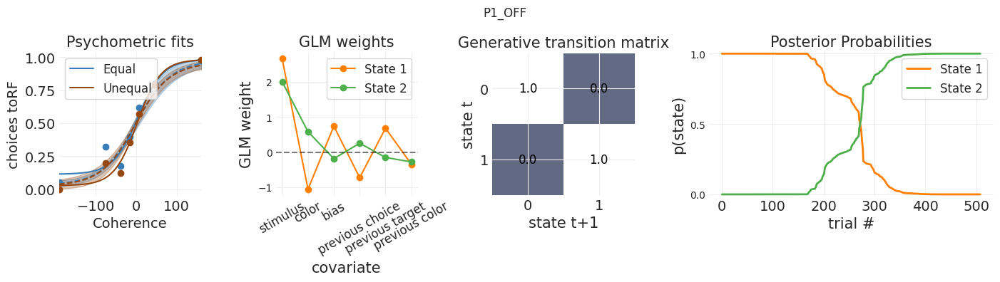

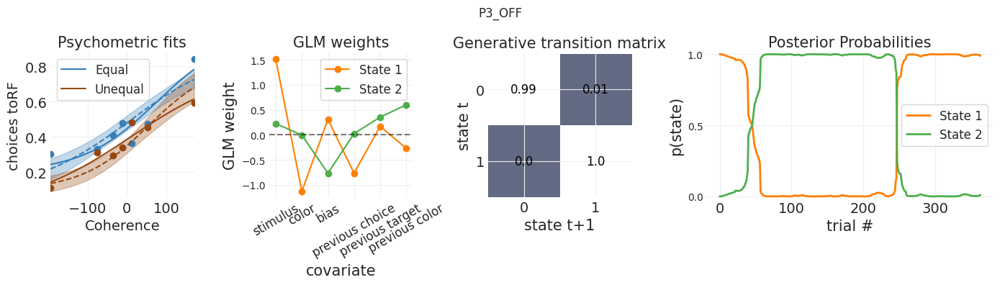

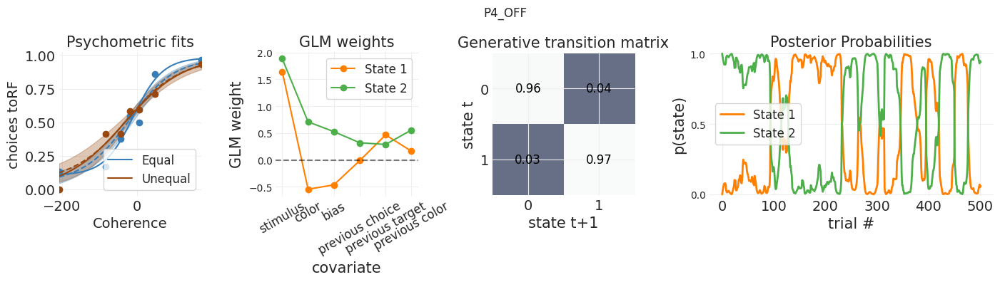

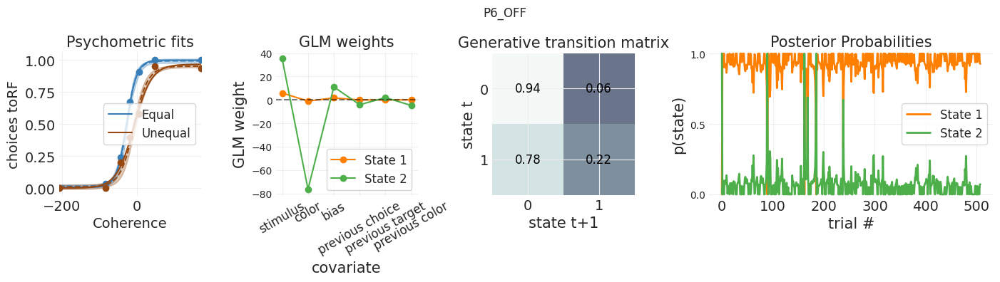

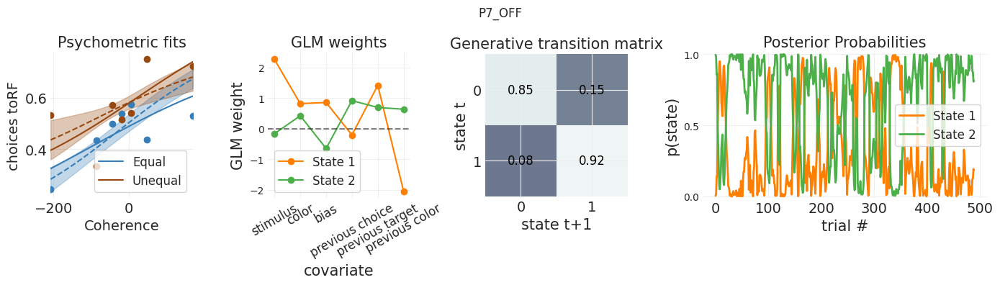

...

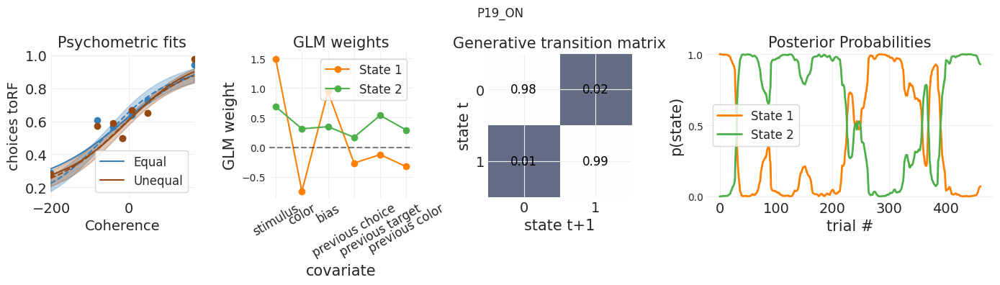

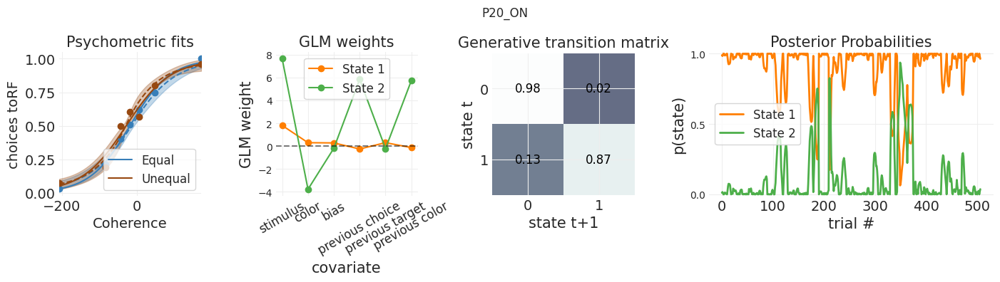

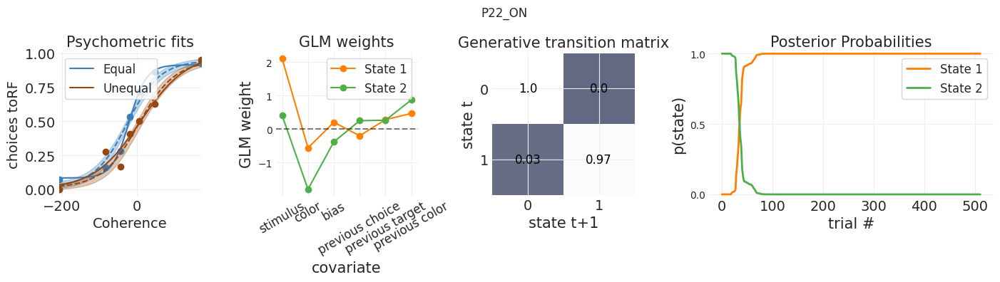

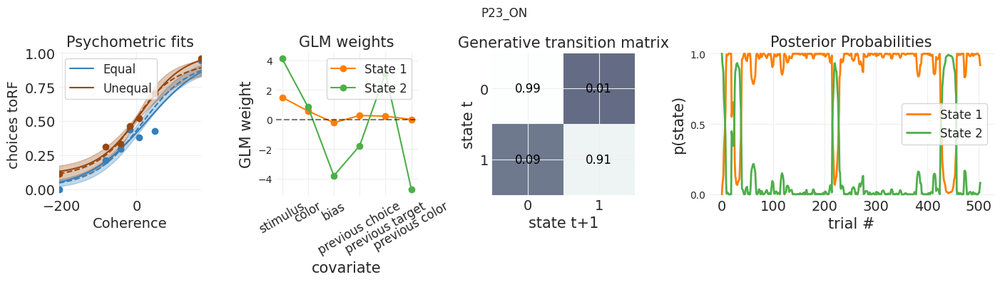

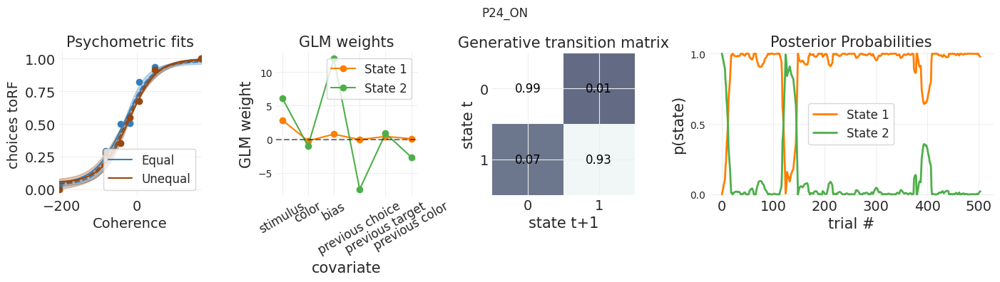

In [11]:
for idx_session, session in enumerate(glm_hmm["session_wise"]['session_ids']):
    train_idx = train_fold[session]
    model = glm_hmm["session_wise"]['models'][idx_session][best_state][best_fold_session_wise[idx_session]]
    choices = glm_hmm["session_wise"]["choices"][idx_session].reshape(-1, 1)
    input = np.array(glm_hmm["session_wise"]["inputs"][idx_session])

    stimulus = glm_hmm["session_wise"]["inputs"][idx_session][:,0].reshape(-1, 1)

    if glm_hmm["session_wise"]["masks"][idx_session] is None:
        mask = None
    else:
        mask = glm_hmm["session_wise"]["masks"][idx_session].reshape(-1, 1)
    mask = np.ones_like(choices, dtype=bool) if mask is None else mask
    plot_model_fits(model, choices, input, stimulus, mask, best_state, session, trial_indices=train_idx)


### Test Dataset

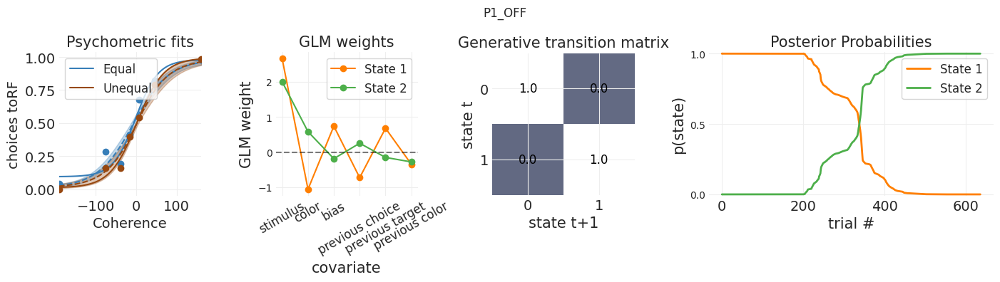

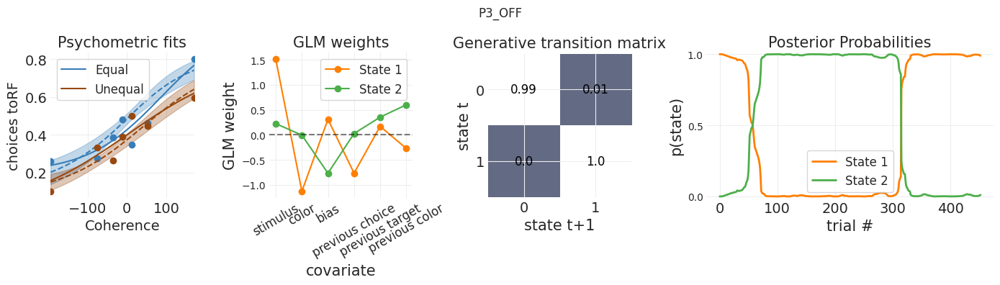

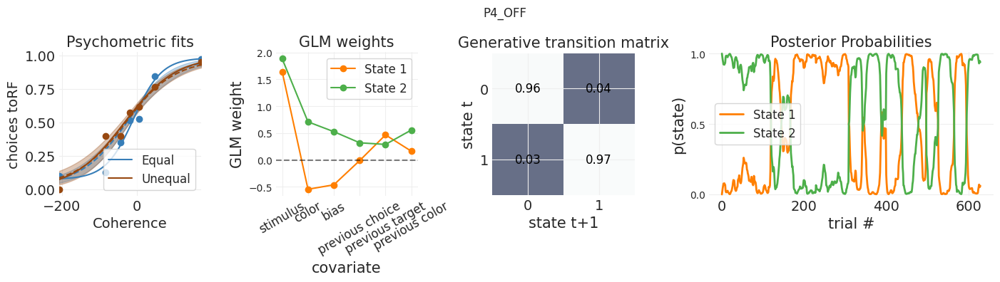

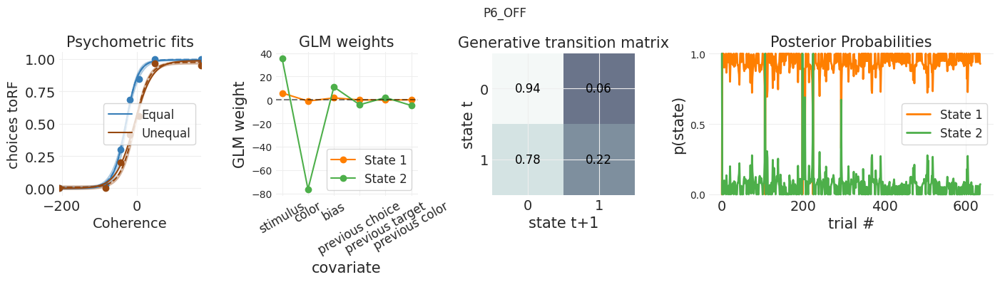

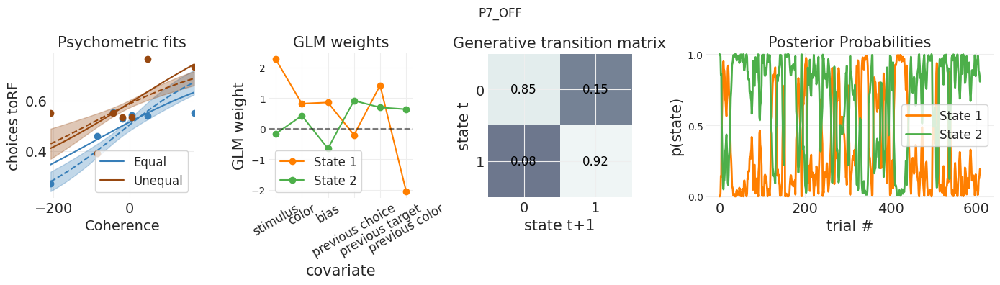

...

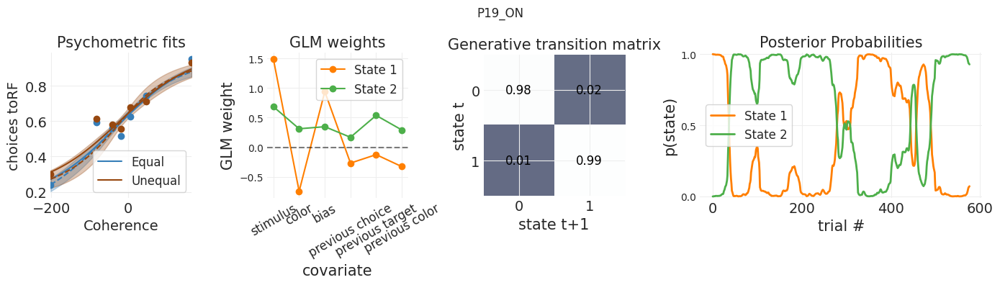

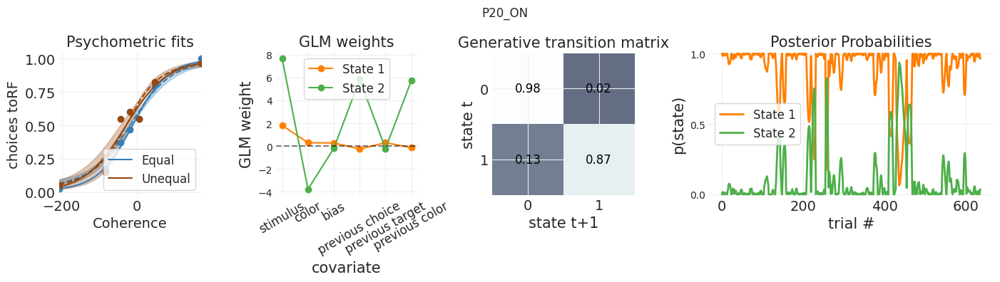

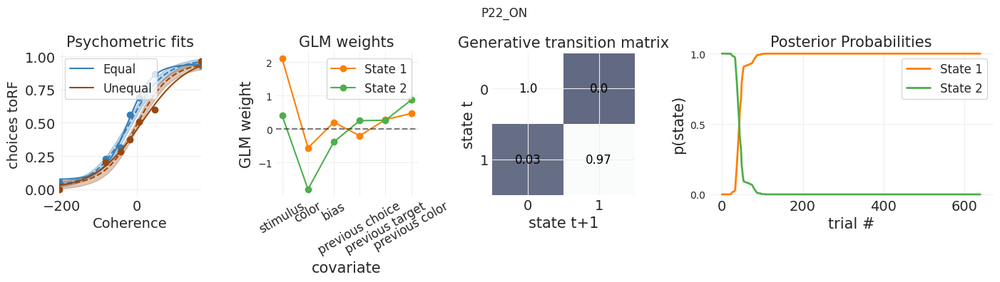

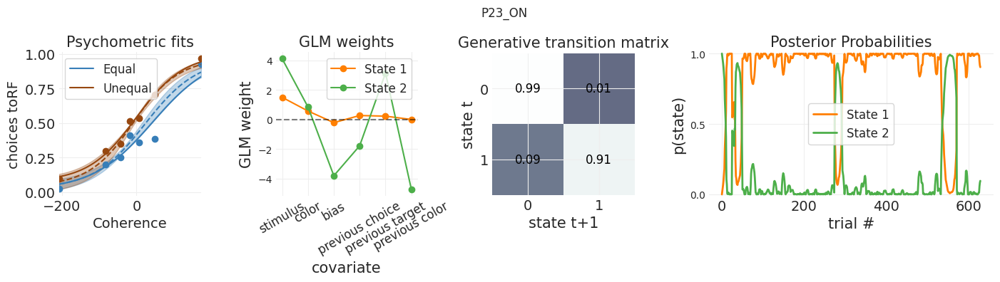

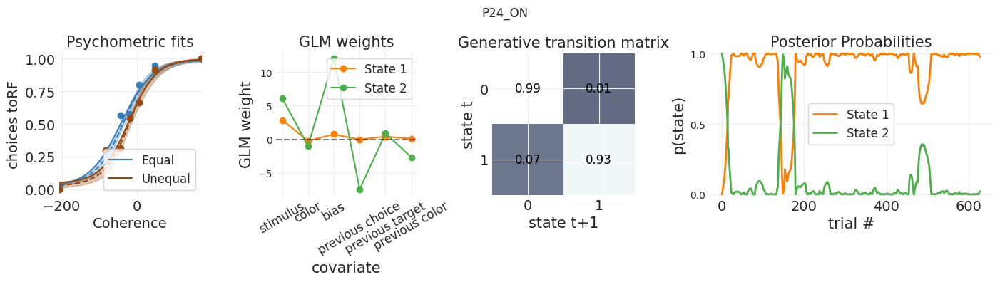

In [12]:
for idx_session, session in enumerate(glm_hmm["session_wise"]['session_ids']):
    test_idx = test_fold[session]
    model = glm_hmm["session_wise"]['models'][idx_session][best_state][best_fold_session_wise[idx_session]]
    choices = glm_hmm["session_wise"]["choices"][idx_session].reshape(-1, 1)
    input = np.array(glm_hmm["session_wise"]["inputs"][idx_session])

    stimulus = glm_hmm["session_wise"]["inputs"][idx_session][:,0].reshape(-1, 1)

    if glm_hmm["session_wise"]["masks"][idx_session] is None:
        mask = None
    else:
        mask = glm_hmm["session_wise"]["masks"][idx_session].reshape(-1, 1)

    plot_model_fits(model, choices, input, stimulus, mask, best_state, session, trial_indices=None)

## Fit on whole session

In [13]:
# get parameter initializations for each session
init_params = {
    'glm_weights': {},
    'transition_matrices': {}
}
choices_session_wise, inputs_session_wise, masks_session_wise = [], [], []

# choose best state and best fold model parameters to initialize
for idx_session, session in enumerate(glm_hmm["session_wise"]['session_ids']):
    init_params['glm_weights'][idx_session] = glm_hmm["session_wise"]['models'][idx_session][best_state][best_fold_session_wise[idx_session]].observations.params
    init_params['transition_matrices'][idx_session] = glm_hmm["session_wise"]['models'][idx_session][best_state][best_fold_session_wise[idx_session]].transitions.params


    choices_session_wise.append(glm_hmm["session_wise"]["choices"][idx_session].reshape(-1, 1))
    inputs_session_wise.append(np.array(glm_hmm["session_wise"]["inputs"][idx_session]))
    masks_session_wise.append(glm_hmm["session_wise"]["masks"][idx_session].reshape(-1, 1))


In [14]:
models_session, fit_ll_session = session_wise_fit(choices_session_wise, inputs_session_wise, masks=masks_session_wise,
                                                                                    n_sessions=len((glm_hmm["session_wise"]['session_ids'])), init_params=init_params, n_states = best_state, n_iters= 1000)

models_session_wise, fit_lls_session_wise ={},{}
for idx_session, session in enumerate(glm_hmm["session_wise"]['session_ids']):
    models_session_wise[session] = models_session[idx_session]
    fit_lls_session_wise[session] = fit_ll_session[idx_session]

Fitting sessions: 100%|██████████| 32/32 [00:00<00:00, 272800.26it/s]


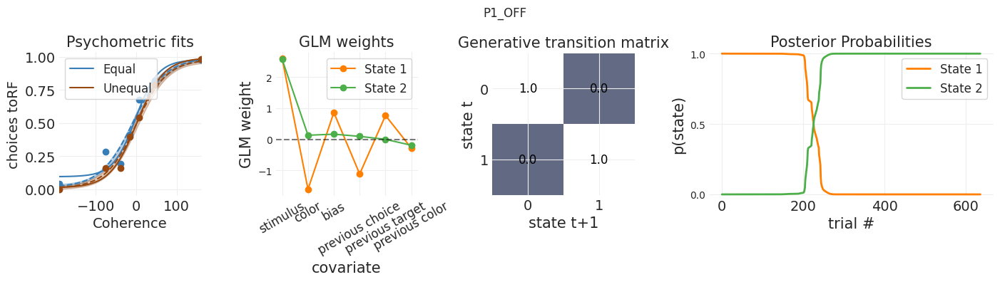

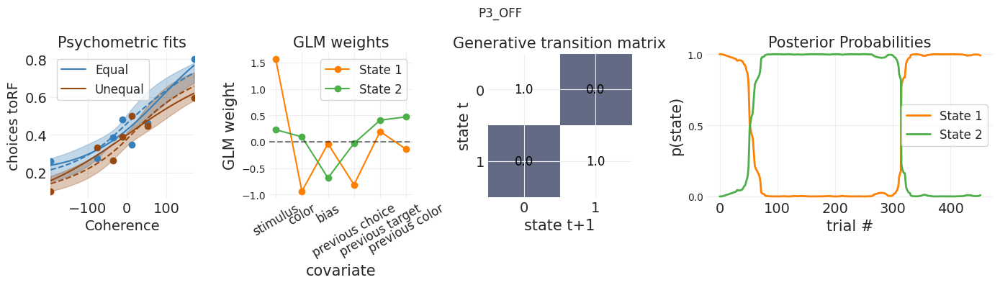

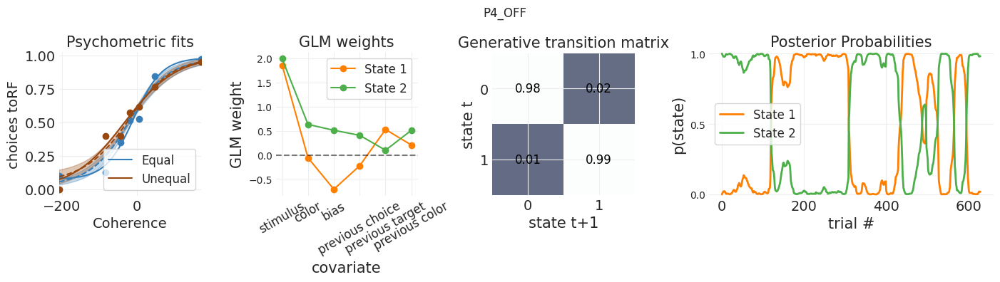

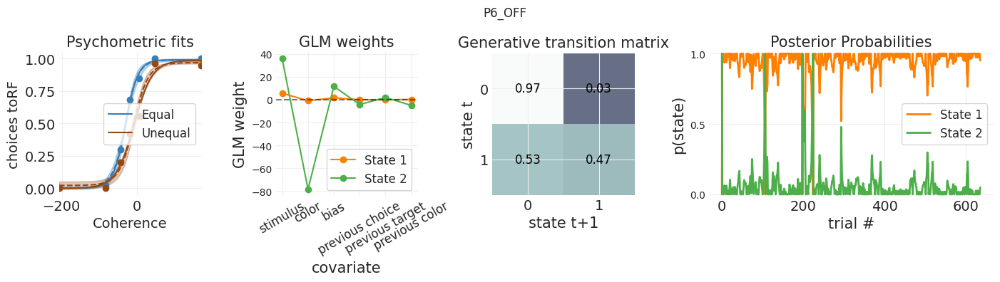

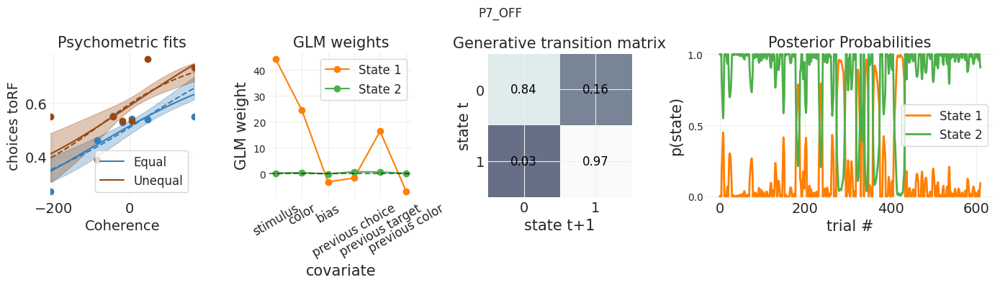

...

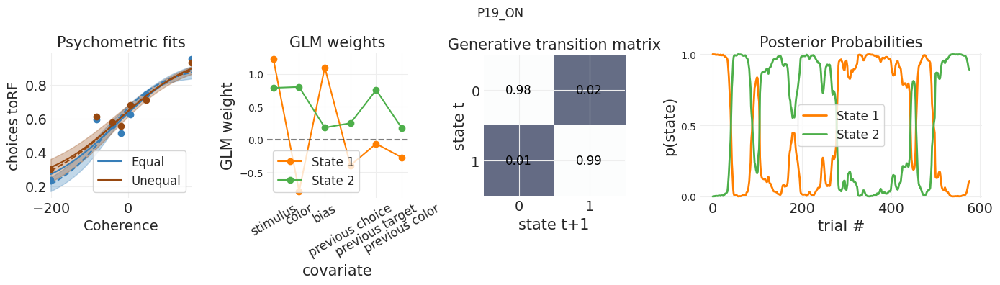

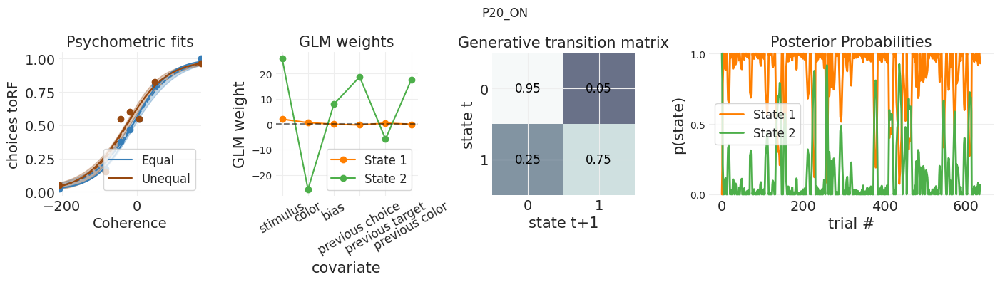

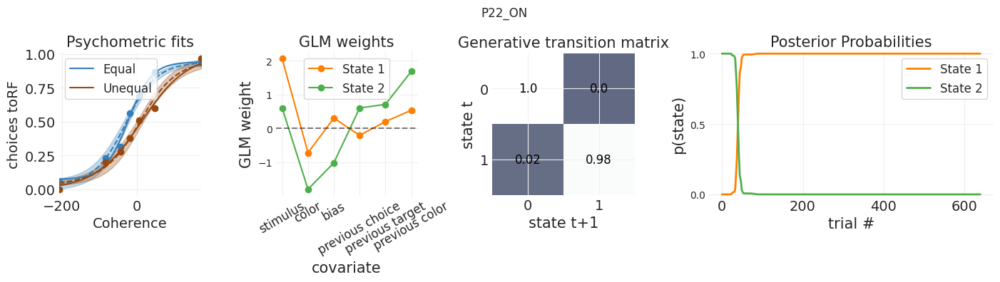

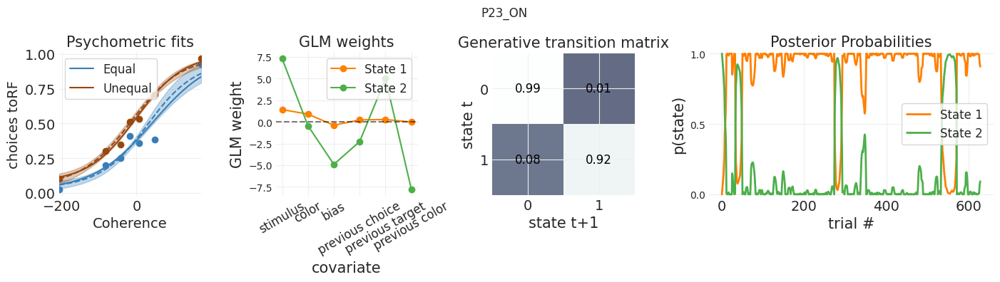

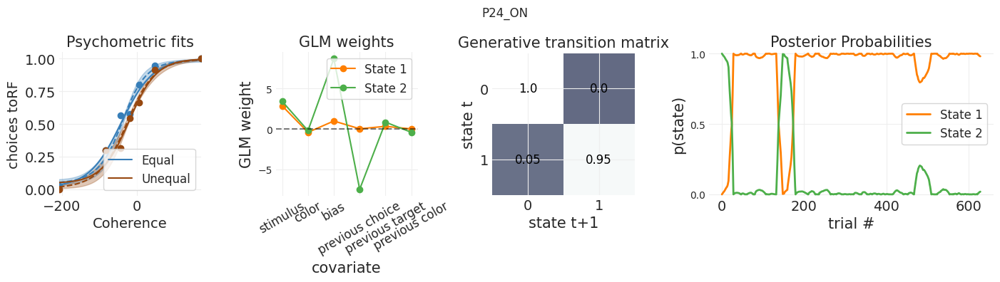

In [15]:
for idx_session, session in enumerate(glm_hmm["session_wise"]['session_ids']):

    model = models_session_wise[session]
    choices = glm_hmm["session_wise"]["choices"][idx_session].reshape(-1, 1)
    input = np.array(glm_hmm["session_wise"]["inputs"][idx_session])

    stimulus = glm_hmm["session_wise"]["inputs"][idx_session][:,0].reshape(-1, 1)

    if glm_hmm["session_wise"]["masks"][idx_session] is None:
        mask = None
    else:
        mask = glm_hmm["session_wise"]["masks"][idx_session].reshape(-1, 1)

    plot_model_fits(model, choices, input, stimulus, mask, best_state, session, trial_indices=None)

### Save whole model

In [63]:
# store data and models for session-wise
session_wise_fits = {
    'models': models_session_wise,
    'fit_lls': fit_lls_session_wise,
    'inputs': inputs_session_wise,
    'choices': choices_session_wise,
    'masks': masks_session_wise,
    'unnormalized_inputs': glm_hmm["session_wise"]["unnormalized_inputs"],
    'session_ids': glm_hmm["session_wise"]['session_ids']
}

models_and_data = {
    'session_wise': session_wise_fits,
}

with open(Path(processed_dir, f'glm_hmm_final.pkl'), 'wb') as f:
    pickle.dump(models_and_data, f)

# Condition-wise plot

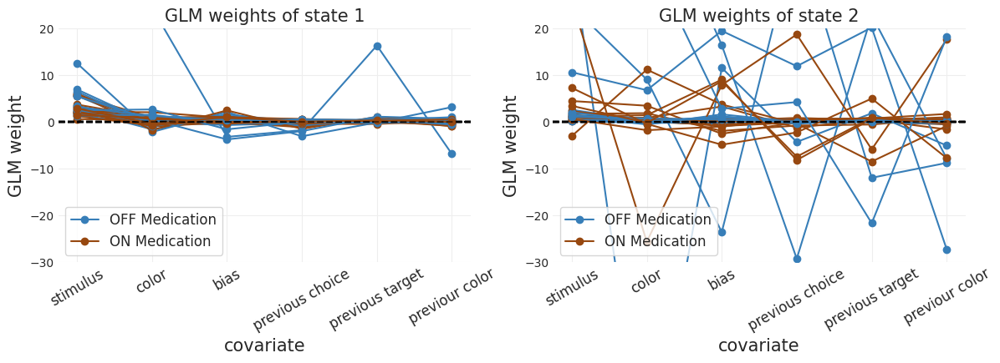

In [ ]:
subjects = metadata['subject_id'].unique()
session_ids = np.array(glm_hmm["session_wise"]['session_ids'])

# 2 x 2 plot (color specific weights X 2 states X 2 medications)
fig = plt.figure(figsize=(14, 8))  # Wider figure for better spacing
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])  # Two subplots with equal size

cols = ['#377eb8', '#974810']  # Colors for awayRF and toRF
legend_added = {0: {cols[0]: False, cols[1]: False}, 1: {cols[0]: False, cols[1]: False}}  # Track legends per subplot


for subject in subjects:
	for medication in ['OFF', 'ON']:
		model = models_session_wise[f"{subject}_{medication}"]
		params = -np.array(model.observations.params).reshape(best_state, -1)
		# Determine the color and label
		color = cols[0] if medication == 'OFF' else cols[1]
		label = 'OFF Medication' if medication == 'OFF' else 'ON Medication'

		for state in range(best_state):
			ax = plt.subplot(gs[state])
			# Only add legend once per color per subplot
			if not legend_added[state][color]:
				ax.plot(np.arange(6), params[state], marker='o', color=color, linestyle='-', lw=1.5, label=label)
				legend_added[state][color] = True  # Mark color as used for this subplot
			else:
				ax.plot(np.arange(6), params[state], marker='o', color=color, linestyle='-', lw=1.5)

			# Formatting
			ax.tick_params(axis='y', labelsize=10)
			ax.set_ylabel("GLM weight", fontsize=15)
			ax.set_xlabel("covariate", fontsize=15)
			ax.set_xticks(range(6))
			ax.set_ylim([-30, 20])
			ax.set_xticklabels(['stimulus', 'color', 'bias', 'previous choice', 'previous target', 'previour color'], fontsize=12, rotation=30)
			ax.axhline(y=0, color="k", alpha=0.5, ls="--")

			ax.legend()  # Legend appears, but only one instance of each color per subplot
			ax.set_title(f"GLM weights of state {state+1}", fontsize=15)


In [ ]:
trem_subjects = metadata.loc[metadata['categorization'] == 'tremor_dominant']['subject_id'].unique()
brady_subjects = metadata.loc[metadata['categorization'] == 'bradykinesia_dominant']['subject_id'].unique()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

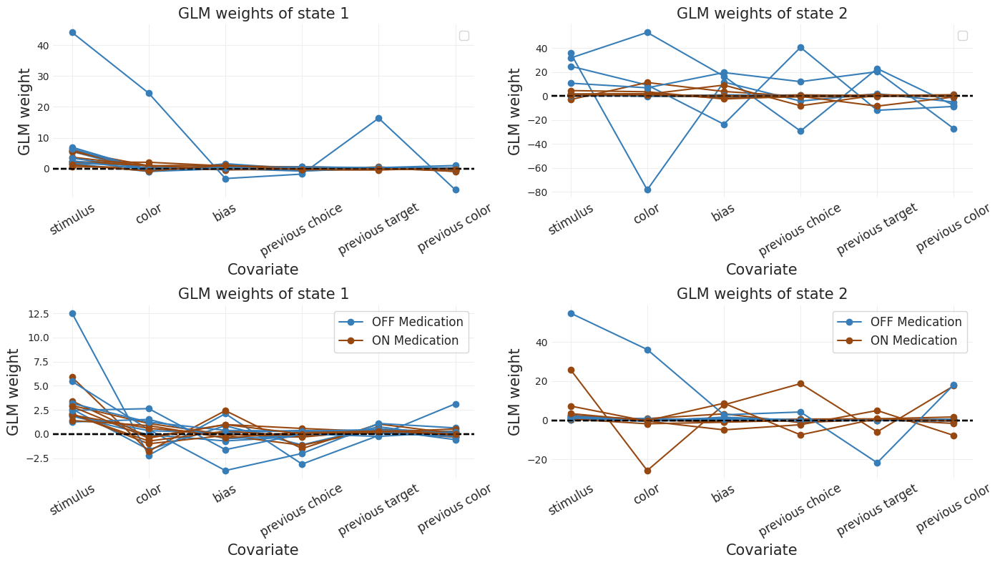

In [87]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import gridspec

fig = plt.figure(figsize=(14, 8))  # Wider figure for better spacing
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])  # Two subplots with equal size

cols = ["#377eb8", "#974810"]  # Colors for OFF and ON medications
legend_added = {  # Track legends per subplot
    0: {cols[0]: False, cols[1]: False},
    1: {cols[0]: False, cols[1]: False},
}

# Loop through subjects and medications
for subject in subjects:
    if subject in trem_subjects:
        condition = 0
    elif subject in brady_subjects:
        condition = 1

    for medication in ["OFF", "ON"]:
        model = models_session_wise[f"{subject}_{medication}"]
        params = -np.array(model.observations.params).reshape(best_state, -1)

        # Determine color and label based on medication
        color = cols[0] if medication == "OFF" else cols[1]
        label = "OFF Medication" if medication == "OFF" else "ON Medication"

        for state in range(best_state):
            ax = plt.subplot(
                gs[(condition * best_state) + state]
            )  # Adjusted indexing for subplots

            # Plotting and managing legend
            if not legend_added[state][color]:
                ax.plot(
                    np.arange(6),
                    params[state],
                    marker="o",
                    color=color,
                    linestyle="-",
                    lw=1.5,
                    label=label,
                )
                legend_added[state][color] = True  # Mark color as used for this subplot
            else:
                ax.plot(
                    np.arange(6),
                    params[state],
                    marker="o",
                    color=color,
                    linestyle="-",
                    lw=1.5,
                )

            # Formatting for each axis
            ax.tick_params(axis="y", labelsize=10)
            ax.set_ylabel("GLM weight", fontsize=15)
            ax.set_xlabel("Covariate", fontsize=15)
            ax.set_xticks(range(6))
            ax.set_xticklabels(
                [
                    "stimulus",
                    "color",
                    "bias",
                    "previous choice",
                    "previous target",
                    "previous color",
                ],
                fontsize=12,
                rotation=30,
            )
            ax.axhline(y=0, color="k", alpha=0.5, ls="--")  # Zero line

            ax.legend()  # Ensure legend is added
            ax.set_title(f"GLM weights of state {state + 1}", fontsize=15)

# Show the plot
plt.tight_layout()
plt.show()


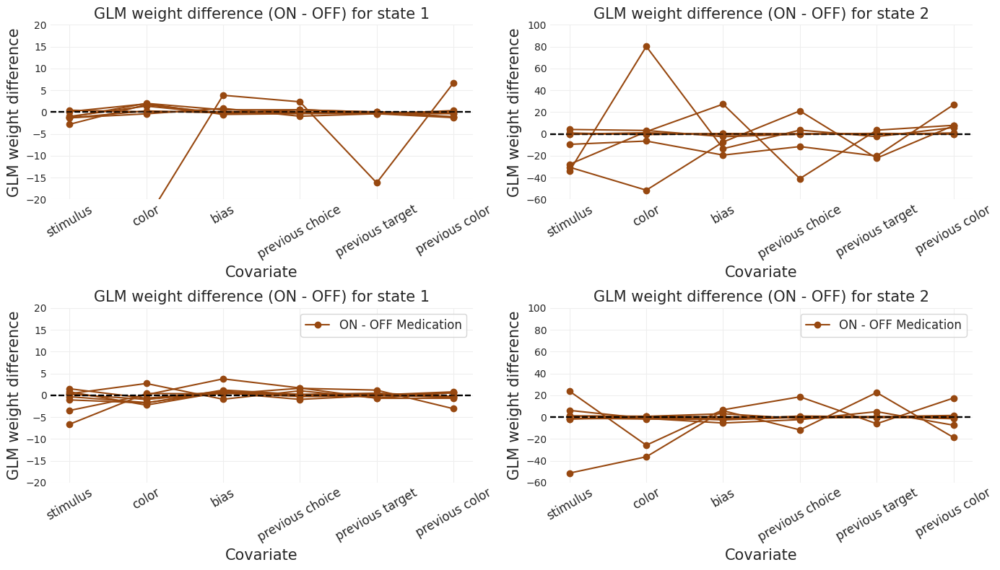

In [102]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import gridspec

fig = plt.figure(figsize=(14, 8))  # Wider figure for better spacing
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])  # Two subplots with equal size

cols = ["#377eb8", "#974810"]  # Colors for OFF and ON medications
legend_added = {  # Track legends per subplot
    0: {cols[0]: False, cols[1]: False},
    1: {cols[0]: False, cols[1]: False},
}

# Loop through subjects
for subject in subjects:
    if subject in trem_subjects:
        condition = 0
    elif subject in brady_subjects:
        condition = 1

    # Get the ON and OFF medication params for the subject
    model_off = models_session_wise[f"{subject}_OFF"]
    model_on = models_session_wise[f"{subject}_ON"]

    params_off = -np.array(model_off.observations.params).reshape(best_state, -1)
    params_on = -np.array(model_on.observations.params).reshape(best_state, -1)

    # Calculate the difference (ON - OFF)
    params_diff = params_on - params_off

    # Plotting the difference
    for state in range(best_state):
        ax = plt.subplot(
            gs[(condition * best_state) + state]
        )  # Adjusted indexing for subplots

        # Plotting the difference between ON and OFF medication params
        ax.plot(
            np.arange(6),
            params_diff[state],
            marker="o",
            color=cols[1],  # Use the ON color for the difference plot (can be adjusted)
            linestyle="-",
            lw=1.5,
            label="ON - OFF Medication",
        )

		# Formatting for each axis
        if state == 0:
            ax.set_ylim([-20, 20])
        elif state == 1:
            ax.set_ylim([-60, 100])

        ax.tick_params(axis="y", labelsize=10)
        ax.set_ylabel("GLM weight difference", fontsize=15)
        ax.set_xlabel("Covariate", fontsize=15)
        ax.set_xticks(range(6))
        ax.set_xticklabels(
            [
                "stimulus",
                "color",
                "bias",
                "previous choice",
                "previous target",
                "previous color",
            ],
            fontsize=12,
            rotation=30,
        )
        ax.axhline(y=0, color="k", alpha=0.5, ls="--")  # Zero line

        # Only add the legend once for the difference plot
        if not legend_added[state][cols[1]]:
            ax.legend()
            legend_added[state][cols[1]] = True  # Mark color as used for this subplot

        ax.set_title(
            f"GLM weight difference (ON - OFF) for state {state + 1}", fontsize=15
        )

# Show the plot
plt.tight_layout()
plt.show()
